# Notebook showing a fast and efficient way to load Sentinel-2 L1C data into xarray

In [2]:
import glob
import os
import numpy as np

import pandas as pd
import geopandas as gpd
import xarray as xr

import matplotlib.pyplot as plt
import matplotlib as mpl
import cartopy.crs as ccrs
from matplotlib.colors import ListedColormap

import memory_profiler

import GRSdriver
from GRSdriver import driver_S2_SAFE as S2

%load_ext memory_profiler

opj = os.path.join

GRSdriver.__version__

The memory_profiler extension is already loaded. To reload it, use:
  %reload_ext memory_profiler


'1.0.5'

### Set the path of the images you want to load, here is a example for the former (v3) and current (v4) image formatting 

In [19]:

imageSAFE ='/data/satellite/S2/cnes/S2B_MSIL1C_20220811T100559_N0400_R022_T31NDH_20220811T171744.SAFE'
imageSAFE ='/home/harmel/Dropbox/Dropbox/satellite/S2/L1C/S2B_MSIL1C_20230711T030529_N0509_R075_T49QDB_20230711T054244.SAFE'

### First, check the availbale bands:

In [20]:
GRSdriver.driver_S2_SAFE.INFO

bandId,0,1,2,3,4,5,6,7,8,9,10,11,12
ESA,B01,B02,B03,B04,B05,B06,B07,B08,B8A,B09,B10,B11,B12
EOREADER,CA,BLUE,GREEN,RED,VRE_1,VRE_2,VRE_3,NIR,NARROW_NIR,WV,SWIR_CIRRUS,SWIR_1,SWIR_2
Wavelength (nm),443,490,560,665,705,740,783,842,865,945,1375,1610,2190
Band width (nm),20,65,35,30,15,15,20,115,20,20,30,90,180
Resolution (m),60,10,10,10,20,20,20,10,20,60,60,20,20


### Choose the bands to be loaded (fill the bandIds array up) and the resolution between 10, 20 and 60 m:

In [21]:
bandIds = [0,1,2,3,8,11]
resolution=60

### Create the s2driver objects for the selected images

In [22]:
l1c = S2.Sentinel2Driver(imageSAFE,band_idx=bandIds,resolution=resolution)

### If you want to get the observation geometry bands only (i.e., sun and viewing zenith angle and relative azimuth)

In [23]:
%time %memit l1c.load_geom()

Exception ignored in: <function Product.__del__ at 0x7f5daf36c310>
Traceback (most recent call last):
  File "/home/harmel/anaconda3/envs/grstbx/lib/python3.9/site-packages/eoreader/products/product.py", line 287, in __del__
    self.clear()
  File "/home/harmel/anaconda3/envs/grstbx/lib/python3.9/site-packages/eoreader/products/product.py", line 1866, in clear
    if isinstance(obj, functools._lru_cache_wrapper):
  File "/home/harmel/anaconda3/envs/grstbx/lib/python3.9/site-packages/Django-4.2b1-py3.9.egg/django/utils/functional.py", line 295, in __getattribute__
    value = super().__getattribute__(name)
  File "/home/harmel/anaconda3/envs/grstbx/lib/python3.9/site-packages/Django-4.2b1-py3.9.egg/django/utils/functional.py", line 266, in inner
    self._setup()
  File "/home/harmel/anaconda3/envs/grstbx/lib/python3.9/site-packages/Django-4.2b1-py3.9.egg/django/conf/__init__.py", line 82, in _setup
    raise ImproperlyConfigured(
django.core.exceptions.ImproperlyConfigured: Requested 

peak memory: 3591.96 MiB, increment: 762.57 MiB
CPU times: user 33.5 s, sys: 9.3 s, total: 42.8 s
Wall time: 8.08 s


In [24]:
l1c.geom

<xarray.Dataset>
Dimensions:      (wl: 6, y: 1830, x: 1830)
Coordinates:
  * x            (x) float64 4e+05 4e+05 4.001e+05 ... 5.097e+05 5.098e+05
  * y            (y) float64 2.2e+06 2.2e+06 2.2e+06 ... 2.09e+06 2.09e+06
    spatial_ref  int64 0
Dimensions without coordinates: wl
Data variables:
    vza          (wl, y, x) float32 1.91 1.913 1.915 1.918 ... 11.13 11.13 11.14
    raa          (wl, y, x) float64 127.0 127.1 127.2 ... 214.1 214.1 214.1
    sza          (y, x) float64 19.41 19.41 19.41 19.41 ... 18.6 18.59 18.59

### If you want to get the radiometric bands only (i.e., top-of-atmosphere reflectance)

In [25]:
%time %memit l1c.load_bands()

/home/harmel/anaconda3/envs/grstbx/lib/python3.9/site-packages/xarray/core/indexes.py:659: RuntimeWarning: '<' not supported between instances of 'SpectralBandNames' and 'SpectralBandNames', sort order is undefined for incomparable objects.
  new_pd_index = pd_indexes[0].append(pd_indexes[1:])


peak memory: 4053.78 MiB, increment: 911.45 MiB
CPU times: user 4min 36s, sys: 11.6 s, total: 4min 47s
Wall time: 20.1 s


### If you prefer to get the geometry and radiometric bands simultaneously 

In [26]:
%time %memit l1c.load_product()

/home/harmel/anaconda3/envs/grstbx/lib/python3.9/site-packages/xarray/core/indexes.py:659: RuntimeWarning: '<' not supported between instances of 'SpectralBandNames' and 'SpectralBandNames', sort order is undefined for incomparable objects.
  new_pd_index = pd_indexes[0].append(pd_indexes[1:])


peak memory: 4446.02 MiB, increment: 1201.47 MiB
CPU times: user 34.6 s, sys: 13.2 s, total: 47.8 s
Wall time: 14.3 s


In [27]:
l1c.prod

<xarray.Dataset>
Dimensions:      (x: 1830, y: 1830, wl: 6, wl_hr: 1950)
Coordinates:
  * x            (x) float64 4e+05 4e+05 4.001e+05 ... 5.097e+05 5.097e+05
  * y            (y) float64 2.2e+06 2.2e+06 2.2e+06 ... 2.09e+06 2.09e+06
    spatial_ref  int64 0
  * wl           (wl) object 443 490 560 665 865 1610
  * wl_hr        (wl_hr) int64 400 401 402 403 404 ... 2345 2346 2347 2348 2349
    time         datetime64[ns] 2023-07-11T03:05:29
Data variables:
    bands        (wl, y, x) float32 0.1285 0.1282 0.1277 ... 0.1071 0.1084
    SRF          (wl, wl_hr) float64 nan nan nan nan nan ... nan nan nan nan nan
    wl_true      (wl) float64 442.2 492.4 558.9 664.9 864.0 1.61e+03
    vza          (wl, y, x) float32 1.91 1.913 1.915 1.918 ... 11.13 11.13 11.14
    raa          (wl, y, x) float64 127.0 127.1 127.2 ... 214.1 214.1 214.1
    sza          (y, x) float64 19.41 19.41 19.41 19.41 ... 18.6 18.59 18.59
Attributes: (12/50)
    long_name:                           CA BLUE GREEN RED NARROW_NIR SWIR_1
    constellation:                       Sentinel-2
    constellation_id:                    S2
    product_path:                        /home/harmel/Dropbox/Dropbox/satelli...
    product_name:                        S2B_MSIL1C_20230711T030529_N0509_R07...
    product_filename:                    S2B_MSIL1C_20230711T030529_N0509_R07...
    ...                                  ...
    satellite:                           S2B
    tile:                                49QDB
    solar_irradiance:                    [1874.3  1959.75 1824.93 1512.79 142...
    solar_irradiance_unit:               W/m²/µm
    mean_solar_azimuth:                  78.17671720226842
    mean_solar_zenith_angle:             18.99610415879017

### From that stage you can check some metadata such as crs or spectral response functions:

EPSG:32649


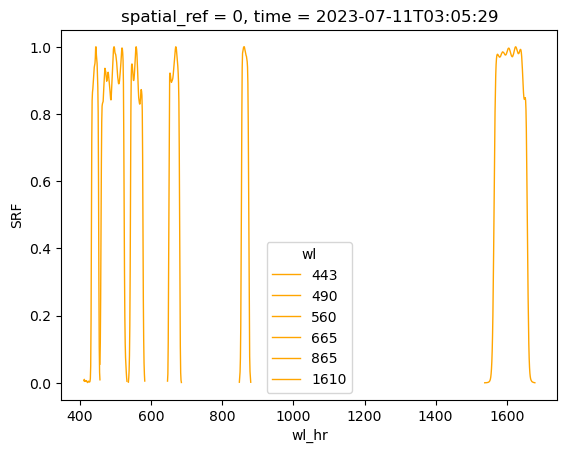

In [28]:
print(l1c.prod.rio.crs)
l1c.prod.SRF.plot(x='wl_hr',hue='wl',color='orange',lw=1)

# Plotting section
The MSI-Sentinel-2 instrument is composed of 12 detectors staggered in two different rows making a "switch" in viewng geometries along the image especially for the azimuth values. Here, we plot the solar and viewing zenith angles as well as the relative azimuth between Sun and sensor directions.
The sun viewing angle (SZA) is common to all the spectral bands.

The sensor angles are dependent on the spectral band considered, here are the viewing zenith angle (VZA) and the relative azimuth (RAZI) for the bands loaded in the S2 object.
## VZA

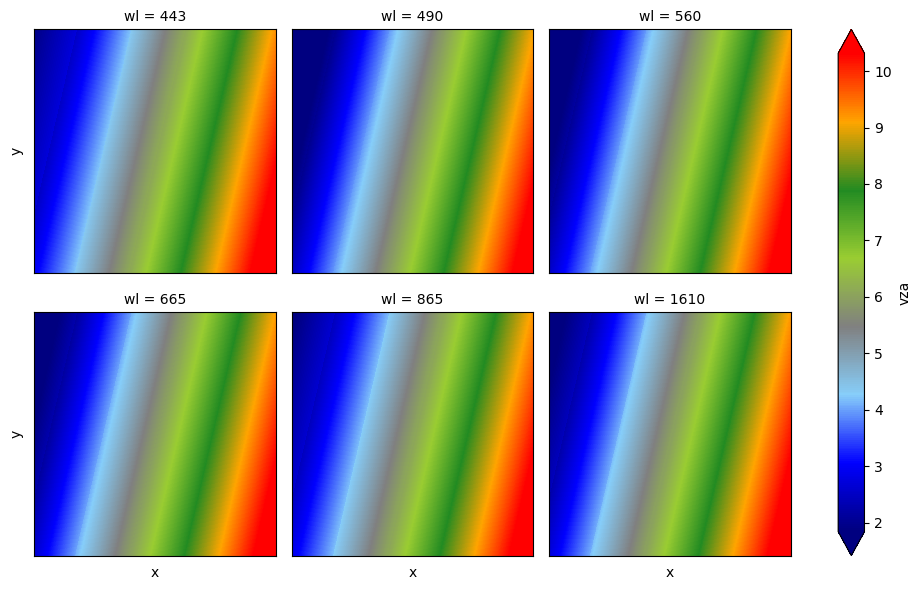

In [29]:
cmap = mpl.colors.LinearSegmentedColormap.from_list("",['navy', "blue", 'lightskyblue', 'gray', 'yellowgreen', 'forestgreen', 'orange', 'red'])
fig = l1c.prod.vza.plot.imshow(col='wl', cmap=cmap, col_wrap=3,  robust=True,subplot_kws=dict(xlabel='',xticks=[], yticks=[]))

## RAZI

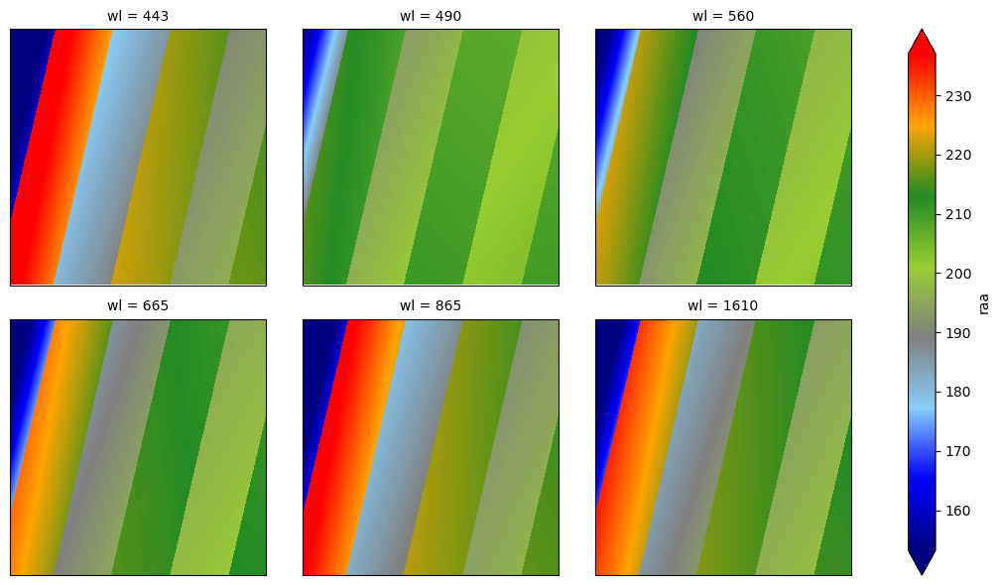

In [32]:
import cartopy.crs as ccrs
str_epsg = str(l1c.prod.bands.rio.crs)
zone = str_epsg[-2:]
is_south = str_epsg[2] == 7
proj = ccrs.UTM(zone, is_south)
fig = l1c.prod.raa.plot.imshow(col='wl', cmap=cmap, col_wrap=3, aspect=1.2, robust=True,subplot_kws=dict(projection=proj))

Check the difference between two bands (e.g., B02-B8A)

In [33]:
param='vza'
diff_vza = l1c.prod[param].sel(wl=490)-l1c.prod[param].sel(wl=865)
param='raa'
diff_raa = l1c.prod[param].sel(wl=490)-l1c.prod[param].sel(wl=865)


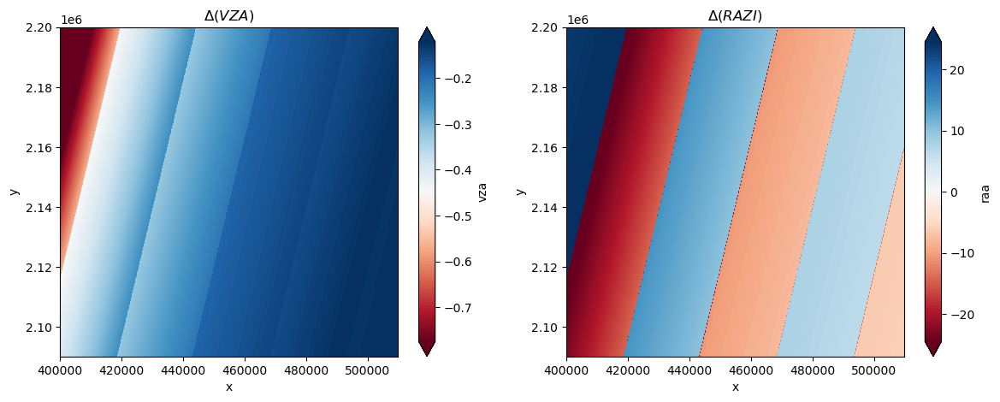

In [34]:
fig, axs = plt.subplots(ncols=2,figsize=(14,5))
diff_vza.plot.imshow(ax=axs[0],cmap=plt.cm.RdBu, robust=True)
axs[0].set_title('$\Delta (VZA)$')
diff_raa.plot.imshow(ax=axs[1],cmap=plt.cm.RdBu, robust=True)
axs[1].set_title('$\Delta (RAZI)$')
plt.show()

The reflectance data can also be easily plotted:

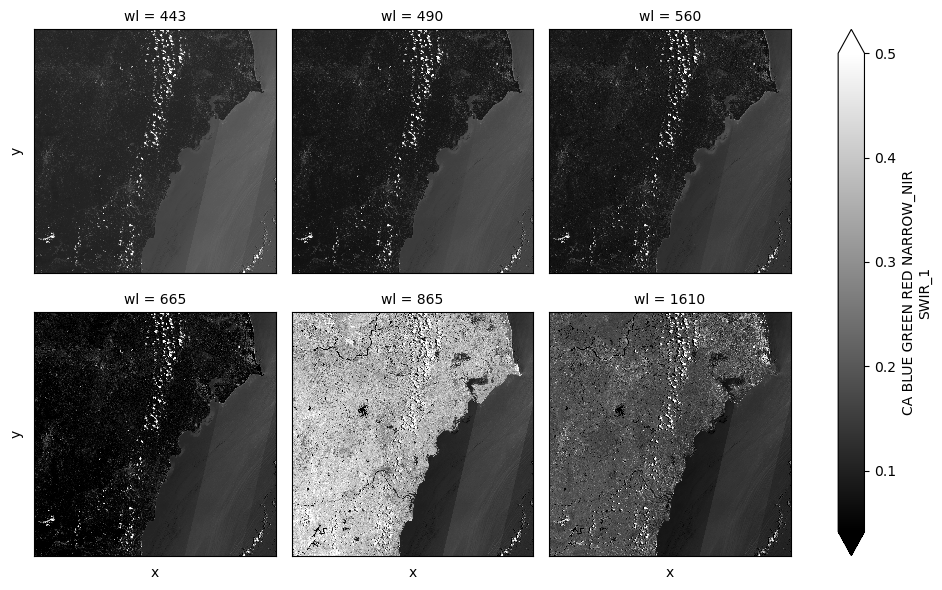

In [35]:

p = l1c.prod.bands.plot.imshow(col='wl', col_wrap=3,  vmax=0.5, robust=True, cmap=plt.cm.binary_r,subplot_kws=dict(xlabel='',xticks=[], yticks=[]))

For nicer plotting we use cartopy and argument 'projection' of matplotlib

In [36]:
import cartopy.crs as ccrs
str_epsg = str(l1c.epsg)
zone = str_epsg[-2:]
is_south = str_epsg[2] == 7
proj = ccrs.UTM(zone, is_south)

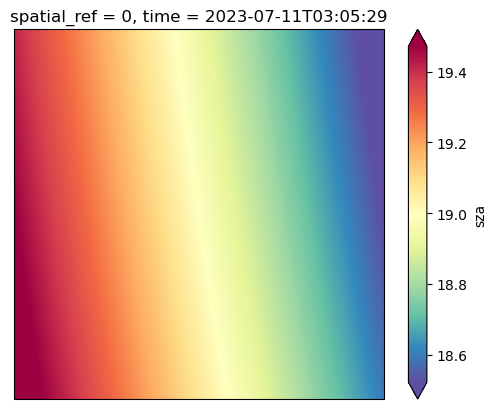

In [37]:
coarsening = 10
p = l1c.prod.sza[::coarsening, ::coarsening].plot.imshow(subplot_kws=dict(projection= proj), robust=True, cmap=plt.cm.Spectral_r)

And the RGB image:

In [38]:
# Get geographic projection and bounds
extent = l1c.extent

bounds = extent.bounds
extent_val = [bounds.minx[0], bounds.maxx[0]-40000, bounds.miny[0], bounds.maxy[0]-50000]
#extent_val = [bounds.minx[0], bounds.maxx[0], bounds.miny[0], bounds.maxy[0]]


Text(0.5, 1.0, '')

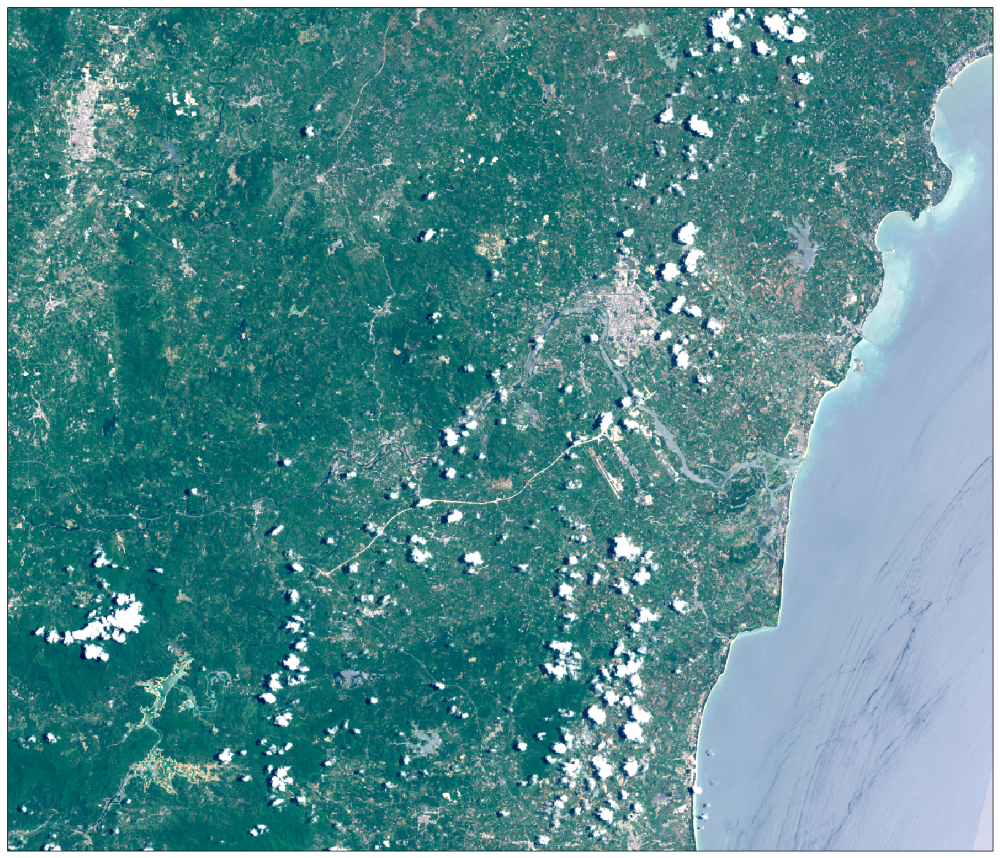

In [39]:
fig = plt.figure(figsize=(20, 15))
ax = plt.subplot(1, 1, 1, projection=proj)
ax.set_extent(extent_val, proj)
coarsening=1
brightness_factor = 3.5
(l1c.prod.bands[:, ::coarsening, ::coarsening].sel(wl=[665,560,490])**0.5**brightness_factor
).plot.imshow(rgb='wl', robust=True,subplot_kws=dict(projection= proj))
ax.set_title('')

## Example of exploiation: compute NDWI for water pixel masking

In [58]:
#coarsening to save memory and speed (if greater than 1)
coarsening=1


# binary cmap
bcmap = mpl.colors.ListedColormap([(0,0,0,0),'steelblue'])

def sindex(R1,R2):
    return (R1-R2)/(R1+R2) 
    
def water_mask(ndwi, threshold=0):
    water = xr.where(ndwi > threshold, 1, 0)
    return water.where(~np.isnan(ndwi))

def plot_water_mask(ndwi,ax,threshold=0):
    water = water_mask(ndwi, threshold)
   
    water.plot.imshow(ax=ax, transform=proj, cmap=bcmap,
                                  cbar_kwargs={'ticks': [0, 1], 'shrink': shrink})
    ax.set_title(str(threshold)+' < NDWI')

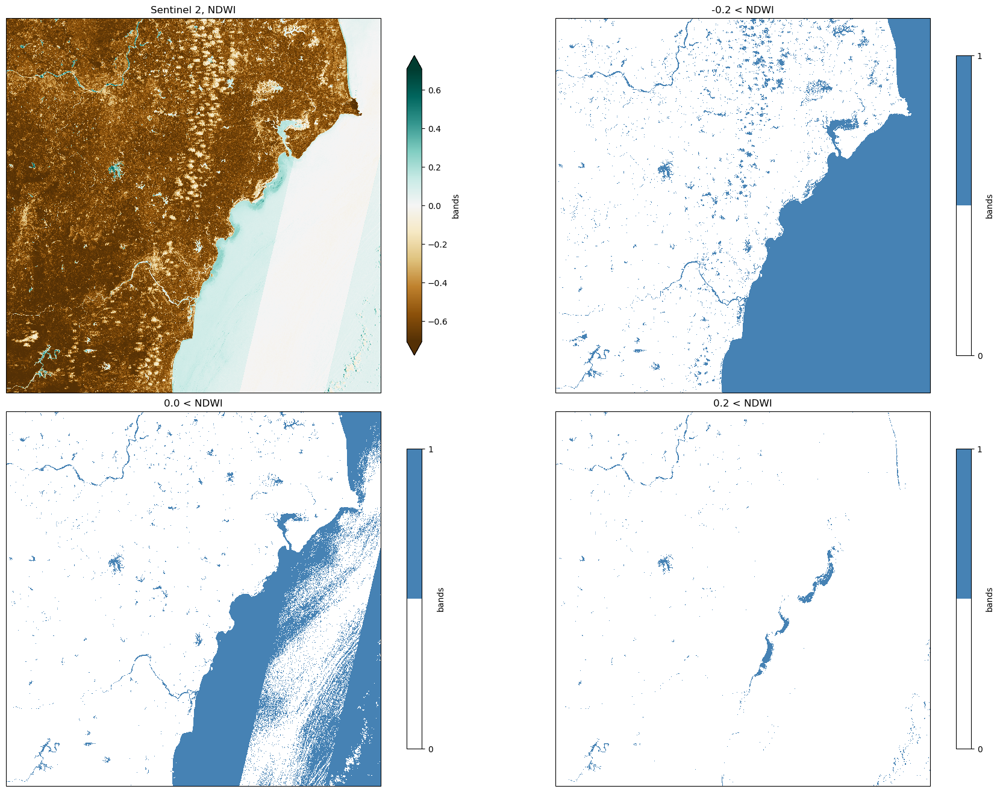

In [60]:
# Compute NDWI
green = l1c.prod.bands.sel(wl=565,method='nearest')
nir = l1c.prod.bands.sel(wl=865,method='nearest')
ndwi = (green - nir) / (green + nir)

fig = plt.figure(figsize=(20, 15))
fig.subplots_adjust(bottom=0.1, top=0.95, left=0.1, right=0.99,
                    hspace=0.05, wspace=0.05)
shrink = 0.8
    
ax = plt.subplot(2, 2, 1, projection=proj)
fig = ndwi[::coarsening, ::coarsening].plot.imshow( transform=proj, cmap=plt.cm.BrBG, robust=True,
                                   cbar_kwargs={'shrink': shrink})
# axes.coastlines(resolution='10m',linewidth=1)
ax.set_title('Sentinel 2, NDWI')

for i,threshold in enumerate([-0.2,0.,0.2]):
    ax = plt.subplot(2, 2, i+2, projection=proj)
    plot_water_mask(ndwi_,ax,threshold=threshold)

plt.show()

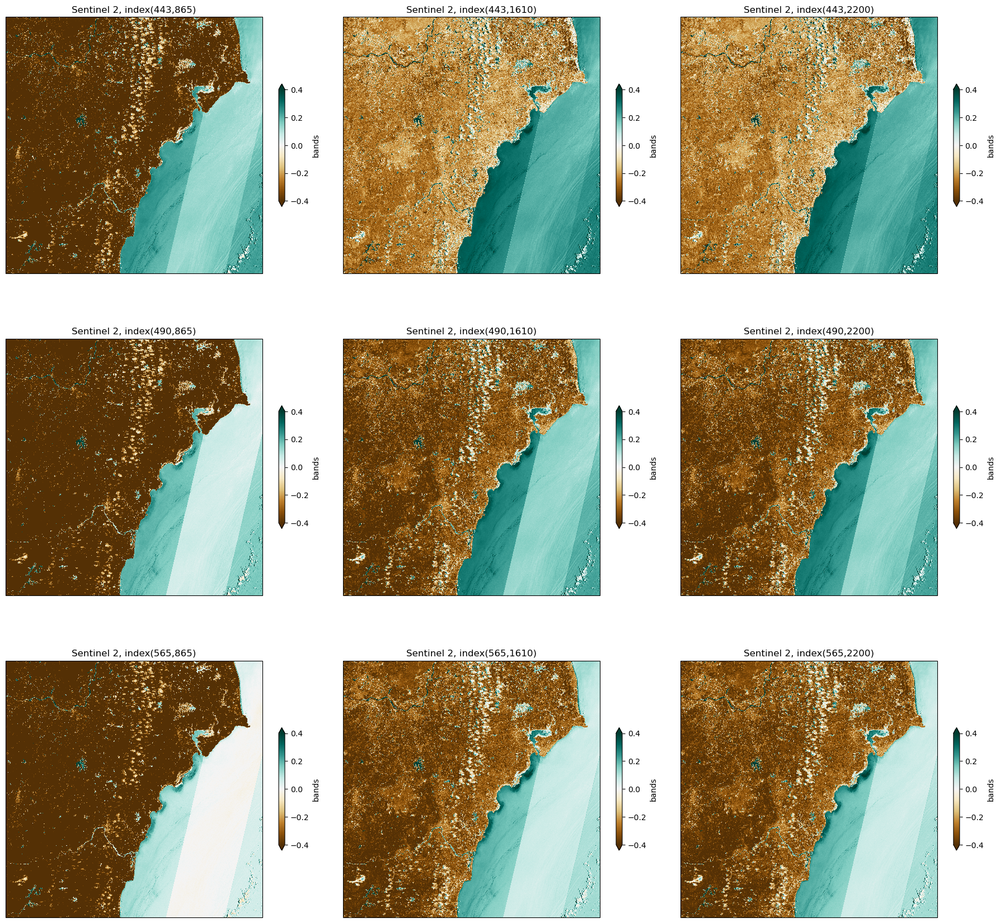

In [56]:

shrink = 0.4
ii=1
ncols=3
nrows=3
fig,axs= plt.subplots(nrows,ncols,figsize=(20, 20),sharey=True,sharex=True,subplot_kw={'projection':proj})
fig.subplots_adjust(bottom=0.1, top=0.95, left=0.1, right=0.99,
                    hspace=0.05, wspace=0.05)
axs_=axs.ravel()
for bands in ([443,865],[443,1610],[443,2200],[490,865],[490,1610],[490,2200],[565,865],[565,1610],[565,2200]):
    #ax = plt.subplot(nrows,ncols, ii, projection=proj)
    
    ax=axs_[ii-1]

    fig = sindex(l1c.prod.bands.sel(wl=bands[0],method='nearest'),l1c.prod.bands.sel(wl=bands[1],method='nearest')).plot.imshow(ax=ax, transform=proj, cmap=plt.cm.BrBG, vmin=-0.4,robust=True,
                                       cbar_kwargs={'shrink': shrink})
    ax.set_title('Sentinel 2, index({:.0f},{:.0f})'.format(*bands))
    ii+=1

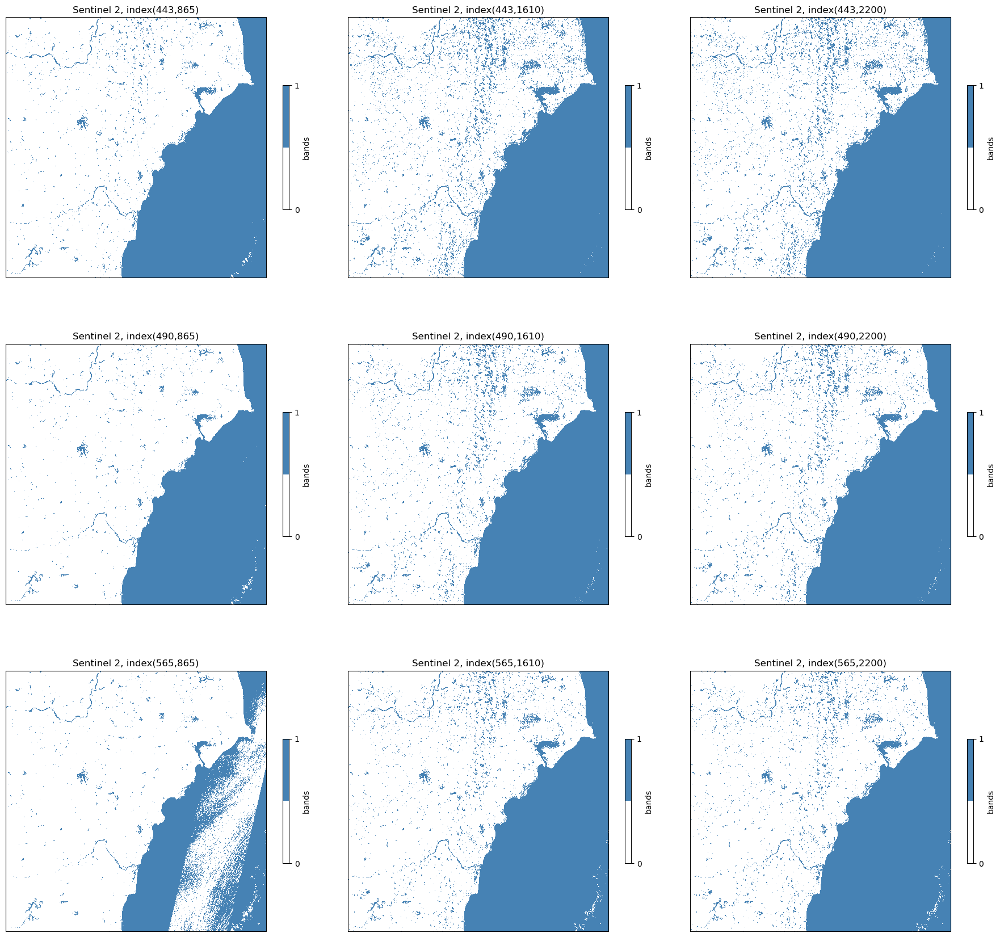

In [59]:
threshold=0
shrink = 0.4
ii=1
ncols=3
nrows=3
fig,axs= plt.subplots(nrows,ncols,figsize=(20, 20),sharey=True,sharex=True,subplot_kw={'projection':proj})
fig.subplots_adjust(bottom=0.1, top=0.95, left=0.1, right=0.99,
                    hspace=0.05, wspace=0.05)
axs_=axs.ravel()
for bands in ([443,865],[443,1610],[443,2200],[490,865],[490,1610],[490,2200],[565,865],[565,1610],[565,2200]):
    #ax = plt.subplot(nrows,ncols, ii, projection=proj)
    
    ax=axs_[ii-1]
    
    norm_index = sindex(l1c.prod.bands.sel(wl=bands[0],method='nearest'),l1c.prod.bands.sel(wl=bands[1],method='nearest'))
    plot_water_mask(norm_index,ax,threshold=threshold)
    ax.set_title('Sentinel 2, index({:.0f},{:.0f})'.format(*bands))
    ii+=1